# RTS heatmap regression training

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
%%html
<style>
.cell-output-ipywidget-background {
    background-color: transparent !important;
}
.jp-OutputArea-output {
   background-color: transparent;
}
</style>

## Import libraries

In [3]:
from pathlib import Path
import geopandas as gpd
from datetime import datetime


In [4]:
import torch
import pytorch_lightning as pl
from torchgeo.datasets import BoundingBox
from rts_utils import get_time_bounds
from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import RichProgressBar, ModelCheckpoint
from pytorch_lightning.callbacks.early_stopping import EarlyStopping
from pytorch_lightning.utilities.model_summary.model_summary import ModelSummary
import fiona
from torchgeo.models import ResNet50_Weights


/home/ww/miniconda3/envs/torchgeo/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
from rts_datamodule_retreat import LandsatDataModule
from rts_model_retreat import SiameseRTS
from rts_path import img_dir, dem_dir, mask_dir, polygon_dir


Running on cryo-A100


## Preparing the data

In [6]:
UTM_CRS = "EPSG:32646"
MINT = datetime.strptime('19840101', "%Y%m%d").timestamp() # parse time_str then convert to POSIX timestamp
MAXT = datetime.strptime('20231231', "%Y%m%d").timestamp()


### Read ROIs for train, val & test

blh north

In [7]:
import pandas as pd

blh_hxm_extent_path = polygon_dir / "beiluhe_hoh_xil_mountain_extent_utm.gpkg"
region_extent_path = polygon_dir / "rts_evaluation_extent_blh_hxm.gpkg"
# region_name = 'blh_north'
# region_name = 'blh_south'
region_name = "hxm_north"
# region_name = 'hxm_south'

blh_hxm_extent_gdf: gpd.GeoDataFrame = gpd.read_file(blh_hxm_extent_path)
blh_hxm_extent_gdf["name"] = "blh_hxm"
region_extent_gdf: gpd.GeoDataFrame = gpd.read_file(region_extent_path)
# region_extent_gdf = region_extent_gdf.loc[region_extent_gdf['name']==region_name]
# bbox = tuple(region_extent_gdf.total_bounds.tolist())
region_extent_gdf = pd.concat(
    [blh_hxm_extent_gdf[["name", "geometry"]], region_extent_gdf], ignore_index=True
)
region_extent_gdf["sort"] = [0, 3, 2, 1, 4]
region_extent_gdf.sort_values(by="sort", inplace=True)
# region_extent_gdf["label"] = region_extent_gdf["name"].apply(lambda x: x.replace("_", " ").upper())
region_extent_gdf["label"] = [
    "BLH & HXM",
    "HXM North",
    "HXM South",
    "BLH North",
    "BLH South",
]
region_extent_gdf

,name,geometry,sort,label
0,blh_hxm,"POLYGON ((437815.99 3837133.166, 515098.987 38...",0,BLH & HXM
3,hxm_north,"MULTIPOLYGON (((456323.199 3926873.29, 472520....",1,HXM North
2,hxm_south,"MULTIPOLYGON (((463276.612 3909211.838, 487992...",2,HXM South
1,blh_north,"MULTIPOLYGON (((463880.426 3874358.707, 463880...",3,BLH North
4,blh_south,"MULTIPOLYGON (((450046.94 3856388.967, 471039....",4,BLH South


In [8]:
# rts_cluster_gdf_path = polygon_dir / 'gt_polygons_round4_4/RTS_cluster_bbox_train_blh_hxm.gpkg'
# layer_list = sorted(fiona.listlayers(rts_cluster_gdf_path))
# print(layer_list)
# bbox_roi_dict_train = {}
# for layer in layer_list: 
#     year = layer[-4:]
#     bbox_cluster_gdf: gpd.GeoDataFrame = gpd.read_file(rts_cluster_gdf_path, layer=layer)
#     bbox_cluster_gdf["weight"] = bbox_cluster_gdf["weight"].astype(float)
#     bbox_cluster_gdf.loc[bbox_cluster_gdf['cluster_id']==-1, 'weight'] = bbox_cluster_gdf.loc[bbox_cluster_gdf['cluster_id']==-1, 'weight']/10
#     bbox_cluster_gdf['roi'] = bbox_cluster_gdf['geometry'].apply(lambda x: BoundingBox(x.bounds[0], x.bounds[2], x.bounds[1], x.bounds[3], MINT, MAXT)) # type: ignore
#     bbox_roi_dict_train[year] = bbox_cluster_gdf.loc[:, ['cluster_id', 'roi', 'weight']].to_dict(orient='list')
# display(bbox_roi_dict_train.keys())


In [9]:
# bbox_cluster_gdf

In [10]:
# bbox_cluster_gdf.plot(edgecolor='red', facecolor='None')

In [11]:
# rts_cluster_gdf_path = polygon_dir / 'gt_polygons_round4_4/RTS_cluster_bbox_validation_blh_hxm.gpkg'
# layer_list = sorted(fiona.listlayers(rts_cluster_gdf_path))
# print(layer_list)
# bbox_roi_dict_valid = {}
# for layer in layer_list: 
#     year = layer[-4:]
#     bbox_cluster_gdf: gpd.GeoDataFrame = gpd.read_file(rts_cluster_gdf_path, layer=layer)
#     bbox_cluster_gdf["weight"] = bbox_cluster_gdf["weight"].astype(float)
#     bbox_cluster_gdf.loc[bbox_cluster_gdf['cluster_id']==-1, 'weight'] = bbox_cluster_gdf.loc[bbox_cluster_gdf['cluster_id']==-1, 'weight']/10
#     bbox_cluster_gdf['roi'] = bbox_cluster_gdf['geometry'].apply(lambda x: BoundingBox(x.bounds[0], x.bounds[2], x.bounds[1], x.bounds[3], MINT, MAXT)) # type: ignore
#     # bbox_cluster_gdf.plot(aspect=1, edgecolor='blue', facecolor='None')
#     bbox_roi_dict_valid[year] = bbox_cluster_gdf.loc[:, ['cluster_id', 'roi', 'weight']].to_dict(orient='list')
# display(bbox_roi_dict_valid.keys())


In [12]:
import pandas as pd

# 1. 设置region_name为blh_north
region_name = 'blh_north'

# 2. 读取extent文件
blh_hxm_extent_path = polygon_dir / "beiluhe_hoh_xil_mountain_extent_utm.gpkg"
region_extent_path = polygon_dir / "rts_evaluation_extent_blh_hxm.gpkg"

region_extent_gdf: gpd.GeoDataFrame = gpd.read_file(region_extent_path)
# 筛选出blh_north区域作为mask
region_mask = region_extent_gdf.loc[region_extent_gdf['name'] == region_name]

# 3. 修改原来的RTS cluster处理代码
# 训练集 - 保持原文件名
rts_cluster_gdf_path = polygon_dir / 'gt_polygons_round4_4/RTS_cluster_bbox_train_blh_hxm.gpkg'
layer_list = sorted(fiona.listlayers(rts_cluster_gdf_path))
print(layer_list)
bbox_roi_dict_train = {}
for layer in layer_list: 
    year = layer[-4:]
    bbox_cluster_gdf: gpd.GeoDataFrame = gpd.read_file(rts_cluster_gdf_path, layer=layer)
    
    # 空间筛选：只保留在blh_north区域内的bbox
    bbox_cluster_gdf = gpd.sjoin(bbox_cluster_gdf, region_mask, predicate='intersects', how='inner')
    bbox_cluster_gdf = bbox_cluster_gdf.drop(columns=['index_right', 'name'])  # 删除join产生的额外列
    
    bbox_cluster_gdf["weight"] = bbox_cluster_gdf["weight"].astype(float)
    bbox_cluster_gdf.loc[bbox_cluster_gdf['cluster_id']==-1, 'weight'] = bbox_cluster_gdf.loc[bbox_cluster_gdf['cluster_id']==-1, 'weight']/10
    bbox_cluster_gdf['roi'] = bbox_cluster_gdf['geometry'].apply(lambda x: BoundingBox(x.bounds[0], x.bounds[2], x.bounds[1], x.bounds[3], MINT, MAXT))
    bbox_roi_dict_train[year] = bbox_cluster_gdf.loc[:, ['cluster_id', 'roi', 'weight']].to_dict(orient='list')
display(bbox_roi_dict_train.keys())

# 验证集 - 保持原文件名
rts_cluster_gdf_path = polygon_dir / 'gt_polygons_round4_4/RTS_cluster_bbox_validation_blh_hxm.gpkg'
layer_list = sorted(fiona.listlayers(rts_cluster_gdf_path))
print(layer_list)
bbox_roi_dict_valid = {}
for layer in layer_list: 
    year = layer[-4:]
    bbox_cluster_gdf: gpd.GeoDataFrame = gpd.read_file(rts_cluster_gdf_path, layer=layer)
    
    # 空间筛选：只保留在blh_north区域内的bbox
    bbox_cluster_gdf = gpd.sjoin(bbox_cluster_gdf, region_mask, predicate='intersects', how='inner')
    bbox_cluster_gdf = bbox_cluster_gdf.drop(columns=['index_right', 'name'])  # 删除join产生的额外列
    
    bbox_cluster_gdf["weight"] = bbox_cluster_gdf["weight"].astype(float)
    bbox_cluster_gdf.loc[bbox_cluster_gdf['cluster_id']==-1, 'weight'] = bbox_cluster_gdf.loc[bbox_cluster_gdf['cluster_id']==-1, 'weight']/10
    bbox_cluster_gdf['roi'] = bbox_cluster_gdf['geometry'].apply(lambda x: BoundingBox(x.bounds[0], x.bounds[2], x.bounds[1], x.bounds[3], MINT, MAXT))
    bbox_roi_dict_valid[year] = bbox_cluster_gdf.loc[:, ['cluster_id', 'roi', 'weight']].to_dict(orient='list')
display(bbox_roi_dict_valid.keys())

['RTS_bbox_2016', 'RTS_bbox_2017', 'RTS_bbox_2018', 'RTS_bbox_2019', 'RTS_bbox_2020', 'RTS_bbox_2021', 'RTS_bbox_2022']


dict_keys(['2016', '2017', '2018', '2019', '2020', '2021', '2022'])

['RTS_bbox_1984', 'RTS_bbox_2005', 'RTS_bbox_2009', 'RTS_bbox_2011', 'RTS_bbox_2012']


dict_keys(['1984', '2005', '2009', '2011', '2012'])

In [13]:
print("keys in bbox_roi_dict_valid:", bbox_roi_dict_valid.keys())
print("keys in bbox_roi_dict_train:", bbox_roi_dict_train.keys())

keys in bbox_roi_dict_valid: dict_keys(['1984', '2005', '2009', '2011', '2012'])
keys in bbox_roi_dict_train: dict_keys(['2016', '2017', '2018', '2019', '2020', '2021', '2022'])


In [14]:
print(f"\nNumber of bbox in training set:")
for year, data in bbox_roi_dict_train.items():
    print(f"  {year}: {len(data['roi'])} bboxes")

print(f"\nNumber of bbox in validation set:")
for year, data in bbox_roi_dict_valid.items():
    print(f"  {year}: {len(data['roi'])} bboxes")


Number of bbox in training set:
  2016: 7 bboxes
  2017: 3 bboxes
  2018: 3 bboxes
  2019: 3 bboxes
  2020: 3 bboxes
  2021: 3 bboxes
  2022: 3 bboxes

Number of bbox in validation set:
  1984: 4 bboxes
  2005: 2 bboxes
  2009: 5 bboxes
  2011: 5 bboxes
  2012: 5 bboxes


### Dectect years & subregions with high RTS expansion

<Axes: >

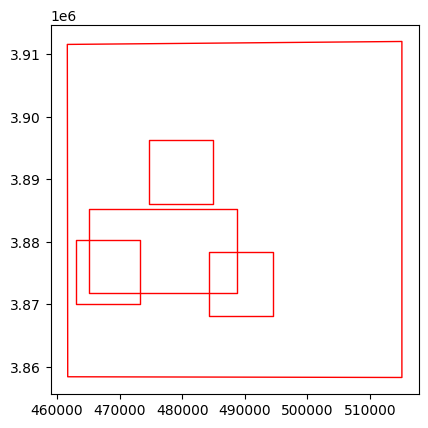

In [15]:
bbox_cluster_gdf.plot(edgecolor='red', facecolor='None')

=== Retreat Statistics (BLH North Region) ===

📊 Basic Statistics:
year_pair  retreat_pixels  retreat_percentage  mean_retreat_value  max_retreat_value
2009-2010            9686            0.121450            1.260066          15.862596
2010-2011           14394            0.180482            1.385084          16.694071
2011-2012           13747            0.172370            1.358420          13.297357
2016-2017           19807            0.248354            1.787426          28.901285
2017-2018            3624            0.045440            2.625161          18.295992
2018-2019            5433            0.068123            2.835874          24.195919
2019-2020            3300            0.041378            2.758224          18.235508
2020-2021             634            0.007950            2.022640          10.287431
2021-2022            1204            0.015097            2.472257          14.013715

=== TOP 5 by Retreat Percentage (任何retreat活动) ===
  2016-2017: 0.25% (19,807 pixel

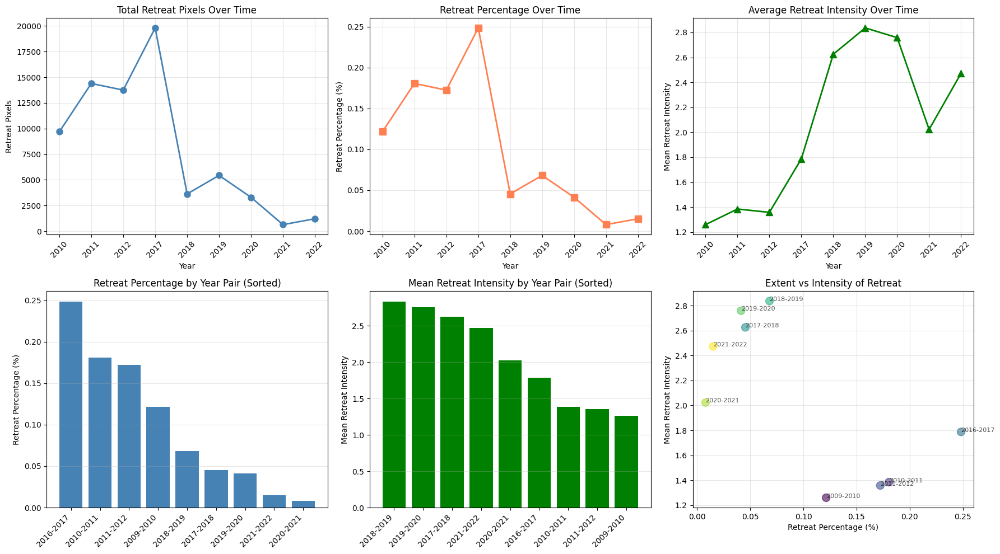

In [16]:
import rasterio
import numpy as np
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt

retreat_dir = Path("/home/ww/ww_cryostore/BLH_heatmap/30m")

# 收集所有retreat map的统计信息
retreat_stats = []

retreat_files = sorted(retreat_dir.glob("retreat_map_*.tif"))

for retreat_file in retreat_files:
    filename = retreat_file.stem
    year_to = filename.split('_')[-1]
    year_from = str(int(year_to) - 1)
    
    try:
        with rasterio.open(retreat_file) as src:
            data = src.read(1)
            
            # 统计有效数据（>0表示有retreat发生）
            valid_mask = (data >= 0)
            retreat_mask = (data > 0)  # 任何大于0的值都表示有retreat
            
            retreat_pixels = np.sum(retreat_mask)
            total_valid_pixels = np.sum(valid_mask)
            retreat_ratio = retreat_pixels / total_valid_pixels if total_valid_pixels > 0 else 0
            
            # 统计retreat值的分布
            retreat_values = data[retreat_mask]
            mean_retreat = np.mean(retreat_values) if len(retreat_values) > 0 else 0
            max_retreat = np.max(retreat_values) if len(retreat_values) > 0 else 0
            median_retreat = np.median(retreat_values) if len(retreat_values) > 0 else 0
            
            # 统计不同强度的retreat
            strong_retreat = np.sum(data > 1.0)  # 强retreat（假设>1为显著）
            
            retreat_stats.append({
                'year_from': year_from,
                'year_to': year_to,
                'year_pair': f"{year_from}-{year_to}",
                'retreat_pixels': int(retreat_pixels),
                'strong_retreat_pixels': int(strong_retreat),
                'total_valid_pixels': int(total_valid_pixels),
                'retreat_ratio': retreat_ratio,
                'retreat_percentage': retreat_ratio * 100,
                'mean_retreat_value': mean_retreat,
                'median_retreat_value': median_retreat,
                'max_retreat_value': max_retreat
            })
            
    except Exception as e:
        print(f"Error processing {retreat_file.name}: {e}")

# 转换为DataFrame
stats_df = pd.DataFrame(retreat_stats)

# 按年份排序（用于时间序列分析）
stats_df_time = stats_df.sort_values('year_to')

print("="*80)
print("=== Retreat Statistics (BLH North Region) ===")
print("="*80)
print("\n📊 Basic Statistics:")
print(stats_df_time[['year_pair', 'retreat_pixels', 'retreat_percentage', 
                      'mean_retreat_value', 'max_retreat_value']].to_string(index=False))

# 按不同指标排序
print("\n" + "="*80)
print("=== TOP 5 by Retreat Percentage (任何retreat活动) ===")
top_by_ratio = stats_df.sort_values('retreat_percentage', ascending=False).head(5)
for idx, row in top_by_ratio.iterrows():
    print(f"  {row['year_pair']}: {row['retreat_percentage']:.2f}% "
          f"({row['retreat_pixels']:,} pixels, mean={row['mean_retreat_value']:.3f})")

print("\n" + "="*80)
print("=== TOP 5 by Mean Retreat Intensity (平均强度) ===")
top_by_mean = stats_df.sort_values('mean_retreat_value', ascending=False).head(5)
for idx, row in top_by_mean.iterrows():
    print(f"  {row['year_pair']}: mean={row['mean_retreat_value']:.3f}, "
          f"max={row['max_retreat_value']:.2f}, "
          f"{row['retreat_percentage']:.2f}% pixels affected")

print("\n" + "="*80)
print("=== TOP 5 by Strong Retreat Pixels (强retreat, >1.0) ===")
top_by_strong = stats_df.sort_values('strong_retreat_pixels', ascending=False).head(5)
for idx, row in top_by_strong.iterrows():
    print(f"  {row['year_pair']}: {row['strong_retreat_pixels']:,} strong pixels "
          f"({row['strong_retreat_pixels']/row['total_valid_pixels']*100:.2f}%)")

# 可视化
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# 1. Retreat像素数时间序列
axes[0, 0].plot(stats_df_time['year_to'], stats_df_time['retreat_pixels'], 
                marker='o', linewidth=2, markersize=8, color='steelblue')
axes[0, 0].set_xlabel('Year')
axes[0, 0].set_ylabel('Retreat Pixels')
axes[0, 0].set_title('Total Retreat Pixels Over Time')
axes[0, 0].grid(alpha=0.3)
axes[0, 0].tick_params(axis='x', rotation=45)

# 2. Retreat比例时间序列
axes[0, 1].plot(stats_df_time['year_to'], stats_df_time['retreat_percentage'], 
                marker='s', linewidth=2, markersize=8, color='coral')
axes[0, 1].set_xlabel('Year')
axes[0, 1].set_ylabel('Retreat Percentage (%)')
axes[0, 1].set_title('Retreat Percentage Over Time')
axes[0, 1].grid(alpha=0.3)
axes[0, 1].tick_params(axis='x', rotation=45)

# 3. 平均retreat强度时间序列
axes[0, 2].plot(stats_df_time['year_to'], stats_df_time['mean_retreat_value'], 
                marker='^', linewidth=2, markersize=8, color='green')
axes[0, 2].set_xlabel('Year')
axes[0, 2].set_ylabel('Mean Retreat Intensity')
axes[0, 2].set_title('Average Retreat Intensity Over Time')
axes[0, 2].grid(alpha=0.3)
axes[0, 2].tick_params(axis='x', rotation=45)

# 4. 柱状图：按retreat比例排序
sorted_by_ratio = stats_df.sort_values('retreat_percentage', ascending=False)
axes[1, 0].bar(range(len(sorted_by_ratio)), sorted_by_ratio['retreat_percentage'], 
               color='steelblue')
axes[1, 0].set_xticks(range(len(sorted_by_ratio)))
axes[1, 0].set_xticklabels(sorted_by_ratio['year_pair'], rotation=45, ha='right')
axes[1, 0].set_ylabel('Retreat Percentage (%)')
axes[1, 0].set_title('Retreat Percentage by Year Pair (Sorted)')
axes[1, 0].grid(axis='y', alpha=0.3)

# 5. 柱状图：按平均强度排序
sorted_by_mean = stats_df.sort_values('mean_retreat_value', ascending=False)
axes[1, 1].bar(range(len(sorted_by_mean)), sorted_by_mean['mean_retreat_value'], 
               color='green')
axes[1, 1].set_xticks(range(len(sorted_by_mean)))
axes[1, 1].set_xticklabels(sorted_by_mean['year_pair'], rotation=45, ha='right')
axes[1, 1].set_ylabel('Mean Retreat Intensity')
axes[1, 1].set_title('Mean Retreat Intensity by Year Pair (Sorted)')
axes[1, 1].grid(axis='y', alpha=0.3)

# 6. 散点图：retreat比例 vs 平均强度
axes[1, 2].scatter(stats_df_time['retreat_percentage'], 
                   stats_df_time['mean_retreat_value'],
                   s=100, alpha=0.6, c=range(len(stats_df_time)), cmap='viridis')
for idx, row in stats_df_time.iterrows():
    axes[1, 2].annotate(row['year_pair'], 
                       (row['retreat_percentage'], row['mean_retreat_value']),
                       fontsize=8, alpha=0.7)
axes[1, 2].set_xlabel('Retreat Percentage (%)')
axes[1, 2].set_ylabel('Mean Retreat Intensity')
axes[1, 2].set_title('Extent vs Intensity of Retreat')
axes[1, 2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

### Initialize the datamodule

assign weights for year pairs & bboxes

In [17]:
import numpy as np
from datetime import datetime
from torchgeo.datasets import BoundingBox as TGBB
from rts_dataset_retreat import Landsat8SR, Landsat57SR, RtsMask

# ============================================================================
# 1. 定义 Retreat 统计数据和权重计算
# ============================================================================

retreat_stats = {
    '2016-2017': {'extent': 0.248354, 'intensity': 1.787426, 'pixels': 19807},
    '2017-2018': {'extent': 0.045440, 'intensity': 2.625161, 'pixels': 3624},
    '2018-2019': {'extent': 0.068123, 'intensity': 2.835874, 'pixels': 5433},
    '2019-2020': {'extent': 0.041378, 'intensity': 2.758224, 'pixels': 3300},
    '2020-2021': {'extent': 0.007950, 'intensity': 2.022640, 'pixels': 634},
    '2021-2022': {'extent': 0.015097, 'intensity': 2.472257, 'pixels': 1204},
}

def calculate_year_weights(retreat_stats, strategy='balanced'):
    weights = {}
    
    for year_pair, stats in retreat_stats.items():
        if strategy == 'balanced':
            # 综合评分：extent × intensity
            score = stats['extent'] * stats['intensity']
        elif strategy == 'extent_focus':
            # 以extent为主，intensity为辅
            score = stats['extent'] * 0.7 + stats['intensity'] * 0.01
        elif strategy == 'intensity_focus':
            # 以intensity为主，extent为辅
            score = stats['intensity'] * 0.7 + stats['extent'] * 10
        else:
            score = stats['extent']
        
        weights[year_pair] = score
    
    max_weight = max(weights.values())
    weights = {k: v/max_weight for k, v in weights.items()}
    
    return weights

# 计算年份权重
# year_weights = calculate_year_weights(retreat_stats, strategy='balanced')

year_weights = {
    '2016-2017': 1.0,
    '2017-2018': 0.3,
    '2018-2019': 0.4,
    '2019-2020': 1.0, # val
    '2020-2021': 0.3,
    '2021-2022': 0.4,
}

print("="*80)
print("📊 Year Pair Weights:")
print("="*80)
for year_pair, weight in sorted(year_weights.items(), key=lambda x: x[1], reverse=True):
    stats = retreat_stats[year_pair]
    print(f"  {year_pair}: weight={weight:.3f} "
          f"(extent={stats['extent']:.3f}%, intensity={stats['intensity']:.3f})")

📊 Year Pair Weights:
  2016-2017: weight=1.000 (extent=0.248%, intensity=1.787)
  2019-2020: weight=1.000 (extent=0.041%, intensity=2.758)
  2018-2019: weight=0.400 (extent=0.068%, intensity=2.836)
  2021-2022: weight=0.400 (extent=0.015%, intensity=2.472)
  2017-2018: weight=0.300 (extent=0.045%, intensity=2.625)
  2020-2021: weight=0.300 (extent=0.008%, intensity=2.023)


In [18]:
def build_year_dict_from_pairs(pairs_tm1_t, roi_dict_train, roi_dict_valid, year_weights=None):
    years, weights, rois = [], [], []
    
    for tm1, t in pairs_tm1_t:
        year_pair = f"{tm1}-{t}"
        tm1_str = str(int(tm1))
        t_str = str(int(t))
        
        # 获取年份权重
        year_weight = year_weights.get(year_pair, 1.0) if year_weights else 1.0
        
        # 合并 tm1 和 t 年的 ROI
        roi_list = []
        cluster_id_list = []
        weight_list = []
        
        # 从 tm1 年获取 ROI
        if tm1_str in roi_dict_train:
            roi_entry = roi_dict_train[tm1_str]
        elif tm1_str in roi_dict_valid:
            roi_entry = roi_dict_valid[tm1_str]
        else:
            print(f"[skip] 两个字典都没有年份 {tm1}")
            continue
        
        # 添加 tm1 年的 ROI
        roi_list.extend(roi_entry['roi'])
        cluster_id_list.extend(roi_entry.get('cluster_id', list(range(len(roi_entry['roi'])))))
        original_weights = roi_entry.get('weight', [1.0] * len(roi_entry['roi']))
        # 应用年份权重
        weight_list.extend([w * year_weight for w in original_weights])
        
        # 如果 t 年也在字典中，也添加进来
        if t_str in roi_dict_train:
            roi_entry_t = roi_dict_train[t_str]
            roi_list.extend(roi_entry_t['roi'])
            cluster_id_list.extend(roi_entry_t.get('cluster_id', list(range(len(roi_entry_t['roi'])))))
            original_weights_t = roi_entry_t.get('weight', [1.0] * len(roi_entry_t['roi']))
            weight_list.extend([w * year_weight for w in original_weights_t])
        elif t_str in roi_dict_valid:
            roi_entry_t = roi_dict_valid[t_str]
            roi_list.extend(roi_entry_t['roi'])
            cluster_id_list.extend(roi_entry_t.get('cluster_id', list(range(len(roi_entry_t['roi'])))))
            original_weights_t = roi_entry_t.get('weight', [1.0] * len(roi_entry_t['roi']))
            weight_list.extend([w * year_weight for w in original_weights_t])
        
        if roi_list:
            years.append(int(t))
            weights.append(year_weight)  # year-level weight
            rois.append({
                'roi': roi_list,
                'cluster_id': cluster_id_list,
                'weight': weight_list  # sample-level weights
            })
        
    return {"year": years, "weight": weights, "roi": rois}

def ybbox(b, y):
    """创建严格年份边界的 bbox"""
    return TGBB(b.minx, b.maxx, b.miny, b.maxy, 
                datetime(y, 1, 1).timestamp(), 
                datetime(y, 12, 31, 23, 59, 59).timestamp())

def has_year_coverage_strict(ds, bbox, year):
    """严格检查：该空间范围内是否有指定年份的文件"""
    qb = ybbox(bbox, year)
    hits = list(ds.index.intersection(tuple(qb), objects=True))
    for h in hits:
        dir_year = ds._extract_dir_year(h.object)
        if dir_year == year:
            return True
    return False

def pick_ds(y, ds_l89, ds_l57):
    """根据年份选择合适的数据集"""
    return ds_l89 if y > 2012 else ds_l57

def filter_year_dict_strict(year_dict, ds_l89, ds_l57, mask_ds):
    """
    过滤 year_dict，只保留 t 年和 t-1 年都有完整覆盖的 ROI
    同时保留权重信息
    """
    years = year_dict["year"]
    year_weights = year_dict["weight"]
    rois = year_dict["roi"]
    
    out_years, out_year_weights, out_rois = [], [], []
    
    for t, year_w, roi_entry in zip(years, year_weights, rois):
        t = int(t)
        tm1 = t - 1
        ds_t = pick_ds(t, ds_l89, ds_l57)
        ds_tm1 = pick_ds(tm1, ds_l89, ds_l57)
        
        roi_list = roi_entry["roi"]
        cluster_ids = roi_entry.get("cluster_id", list(range(len(roi_list))))
        weights_list = roi_entry.get("weight", [1.0] * len(roi_list))
        
        valid_indices = []
        for i, bx in enumerate(roi_list):
            ok_t = has_year_coverage_strict(ds_t, bx, t)
            ok_tm1 = has_year_coverage_strict(ds_tm1, bx, tm1)
            ok_mask = has_year_coverage_strict(mask_ds, bx, t)
            
            if ok_t and ok_tm1 and ok_mask:
                valid_indices.append(i)
        
        if valid_indices:
            out_years.append(t)
            out_year_weights.append(year_w)
            out_rois.append({
                "cluster_id": [cluster_ids[j] for j in valid_indices],
                "roi": [roi_list[j] for j in valid_indices],
                "weight": [weights_list[j] for j in valid_indices],
            })
            print(f"[{tm1}->{t}] 保留 {len(valid_indices)}/{len(roi_list)} 个 ROI")
        else:
            print(f"[{tm1}->{t}] ⚠️ 没有有效 ROI，跳过该年份对")
    
    return {"year": out_years, "weight": out_year_weights, "roi": out_rois}

# 定义年份对
train_pairs = [
    (2016, 2017),
    (2020, 2021),
    (2021, 2022),
]
val_pairs = [(2019, 2020)]
test_pairs = [(2019, 2020)]

print("\n" + "="*80)
print("🔧 Building Year Dicts with Weights...")
print("="*80)

# 构造带权重的 year_dict
year_dict_train_weighted = build_year_dict_from_pairs(
    train_pairs, 
    bbox_roi_dict_train, 
    bbox_roi_dict_valid,
    year_weights=year_weights
)
year_dict_val_weighted = build_year_dict_from_pairs(
    val_pairs, 
    bbox_roi_dict_train, 
    bbox_roi_dict_valid,
    year_weights=None
)
year_dict_test_weighted = build_year_dict_from_pairs(
    test_pairs, 
    bbox_roi_dict_train, 
    bbox_roi_dict_valid,
    year_weights=None
)

print(f"\nInitial train years: {year_dict_train_weighted['year']}")
print(f"Initial val years: {year_dict_val_weighted['year']}")
print(f"Initial test years: {year_dict_test_weighted['year']}")

print("\n" + "="*80)
print("🔍 Creating Audit Datasets...")
print("="*80)

ds_l89_audit = Landsat8SR(
    root=str(img_dir), 
    crs=UTM_CRS, 
    bands=["SR_B2","SR_B3","SR_B4","SR_B5"], 
    res=30, 
    cache=False
)
ds_l57_audit = Landsat57SR(
    root=str(img_dir), 
    crs=UTM_CRS, 
    bands=["SR_B1","SR_B2","SR_B3","SR_B4"], 
    res=30, 
    cache=False
)
mask_ds_audit = RtsMask(
    root=str(mask_dir), 
    crs=UTM_CRS, 
    bands=["heatmap","segment","retreat"], 
    res=30, 
    cache=False
)

print("\n" + "="*80)
print("🔍 Filtering ROIs by Data Coverage...")
print("="*80)

print("\n过滤 train ROIs...")
year_dict_train = filter_year_dict_strict(
    year_dict_train_weighted, 
    ds_l89_audit, 
    ds_l57_audit, 
    mask_ds_audit
)

print("\n过滤 val ROIs...")
year_dict_val = filter_year_dict_strict(
    year_dict_val_weighted, 
    ds_l89_audit, 
    ds_l57_audit, 
    mask_ds_audit
)

print("\n过滤 test ROIs...")
year_dict_test = filter_year_dict_strict(
    year_dict_test_weighted, 
    ds_l89_audit, 
    ds_l57_audit, 
    mask_ds_audit
)

print("\n" + "="*80)
print("✅ FINAL WEIGHTED CONFIGURATION")
print("="*80)

print("\n过滤后的年份配置:")
print(f"  train years: {year_dict_train['year']}")
print(f"  val years: {year_dict_val['year']}")
print(f"  test years: {year_dict_test['year']}")

print("\n📦 Training Set Details:")
for i, (t, year_w, roi) in enumerate(zip(year_dict_train['year'], 
                                           year_dict_train['weight'], 
                                           year_dict_train['roi'])):
    year_pair = f"{t-1}->{t}"
    avg_weight = np.mean(roi['weight'])
    print(f"  {year_pair}:")
    print(f"    - ROIs: {len(roi['roi'])}")
    print(f"    - Year weight: {year_w:.3f}")
    print(f"    - Avg sample weight: {avg_weight:.3f}")
    print(f"    - Weight range: [{min(roi['weight']):.3f}, {max(roi['weight']):.3f}]")

print("\n📦 Validation Set Details:")
for i, (t, year_w, roi) in enumerate(zip(year_dict_val['year'], 
                                           year_dict_val['weight'], 
                                           year_dict_val['roi'])):
    year_pair = f"{t-1}->{t}"
    avg_weight = np.mean(roi['weight'])
    print(f"  {year_pair}:")
    print(f"    - ROIs: {len(roi['roi'])}")
    print(f"    - Year weight: {year_w:.3f}")
    print(f"    - Avg sample weight: {avg_weight:.3f}")
    print(f"    - Weight range: [{min(roi['weight']):.3f}, {max(roi['weight']):.3f}]")

print("\n" + "="*80)
print("🎯 Weight Strategy Summary:")
print("="*80)
print(f"  Strategy: balanced (extent × intensity)")
print(f"  Normalization: max weight = 1.0")
print(f"\n  Year pair weights applied:")
for pair in train_pairs + val_pairs:
    pair_str = f"{pair[0]}-{pair[1]}"
    if pair_str in year_weights:
        print(f"    {pair_str}: {year_weights[pair_str]:.3f}")
print("="*80)


🔧 Building Year Dicts with Weights...

Initial train years: [2017, 2021, 2022]
Initial val years: [2020]
Initial test years: [2020]

🔍 Creating Audit Datasets...
[Landsat8SR] Reindexed 70 files by directory year
[Landsat57SR] Reindexed 59 files by directory year
[RtsMask] Reindexed 38 files by directory year

🔍 Filtering ROIs by Data Coverage...

过滤 train ROIs...
[2016->2017] 保留 10/10 个 ROI
[2020->2021] 保留 6/6 个 ROI
[2021->2022] 保留 6/6 个 ROI

过滤 val ROIs...
[2019->2020] 保留 6/6 个 ROI

过滤 test ROIs...
[2019->2020] 保留 6/6 个 ROI

✅ FINAL WEIGHTED CONFIGURATION

过滤后的年份配置:
  train years: [2017, 2021, 2022]
  val years: [2020]
  test years: [2020]

📦 Training Set Details:
  2016->2017:
    - ROIs: 10
    - Year weight: 1.000
    - Avg sample weight: 149.560
    - Weight range: [10.000, 772.000]
  2020->2021:
    - ROIs: 6
    - Year weight: 0.300
    - Avg sample weight: 93.010
    - Weight range: [3.000, 229.200]
  2021->2022:
    - ROIs: 6
    - Year weight: 0.400
    - Avg sample weight: 

Initialise datamodule

In [19]:
BAND_NUM = 4
USE_DEM = True

landsat_dm = LandsatDataModule(
    img_dir=str(img_dir),
    mask_dir=str(mask_dir),
    dem_dir=str(dem_dir),
    train_length=32*100,
    val_length=500,
    test_length=1000,
    year_dict_train=year_dict_train,
    year_dict_val=year_dict_val,
    year_dict_test=year_dict_val,
    band_num=BAND_NUM,
    use_dem=USE_DEM,
    batch_size=32, # 16
    patch_size=256,
    crs=UTM_CRS,
    res=30,
    use_l7=True,
    retreat_dir="/home/ww/ww_cryostore/BLH_heatmap/30m",
)

[Landsat8SR] Reindexed 70 files by directory year
[Landsat57SR] Reindexed 59 files by directory year
[RtsMask] Reindexed 38 files by directory year


In [20]:
batch = next(iter(landsat_dm.train_dataloader()))

print("year_t:", batch["year_t"][:32])
print("year_tm1:", batch["year_tm1"][:32])

year_t: [2017, 2017, 2017, 2017, 2022, 2022, 2017, 2017, 2017, 2022, 2022, 2017, 2017, 2017, 2017, 2017, 2017, 2021, 2017, 2022, 2017, 2022, 2017, 2017, 2022, 2021, 2022, 2021, 2021, 2021, 2017, 2022]
year_tm1: [2016, 2016, 2016, 2016, 2021, 2021, 2016, 2016, 2016, 2021, 2021, 2016, 2016, 2016, 2016, 2016, 2016, 2020, 2016, 2021, 2016, 2021, 2016, 2016, 2021, 2020, 2021, 2020, 2020, 2020, 2016, 2021]


In [21]:
# check loader path

batch = next(iter(landsat_dm.train_dataloader()))

for i in range(batch["image_t"].shape[0]):
    yt = int(batch["year_t"][i])
    ytm1 = int(batch["year_tm1"][i])
    pt = batch["path_t"][i]
    ptm1 = batch["path_tm1"][i]
    print(f"[sample {i}] year_t={yt}, year_tm1={ytm1}")
    print(f" path_t: {pt}")
    print(f" path_tm1: {ptm1}")
    

[sample 0] year_t=2022, year_tm1=2021
 path_t: /DATA/DATA1/joey/LANDSAT_LC08_MIX/2022/LANDSAT_LE07_C02_T1_L2_LE07_137138_20220726_20220817_mosaic_beiluhe_hohxil_utm.tif
 path_tm1: /DATA/DATA1/joey/LANDSAT_LC08_MIX/2021/LANDSAT_LE07_C02_T1_L2_LE07_137138_20210706_20211010_geometric_median_beiluhe_hohxil_utm.tif
[sample 1] year_t=2017, year_tm1=2016
 path_t: /DATA/DATA1/joey/LANDSAT_LC08_MIX/2017/LANDSAT_LC08_C02_T1_L2_LC08_137036_20170728_Cloud_09_clip.tif
 path_tm1: /DATA/DATA1/joey/LANDSAT_LC08_MIX/2016/LANDSAT_LE07_C02_T1_L2_LE07_137138_20160802_20160818_geometric_median_beiluhe_hohxil_utm.tif
[sample 2] year_t=2022, year_tm1=2021
 path_t: /DATA/DATA1/joey/LANDSAT_LC08_MIX/2022/LANDSAT_LE07_C02_T1_L2_LE07_137138_20220726_20220817_mosaic_beiluhe_hohxil_utm.tif
 path_tm1: /DATA/DATA1/joey/LANDSAT_LC08_MIX/2021/LANDSAT_LE07_C02_T1_L2_LE07_137138_20210706_20211010_geometric_median_beiluhe_hohxil_utm.tif
[sample 3] year_t=2017, year_tm1=2016
 path_t: /DATA/DATA1/joey/LANDSAT_LC08_MIX/2017

In [22]:
from collections import Counter
import matplotlib.pyplot as plt

batch_size = 32
num_batches = 100

year_t_list = []
year_tm1_list = []

for i, batch in enumerate(landsat_dm.train_dataloader()):
    if i >= num_batches:
        break
    year_t_list.extend(batch["year_t"])
    year_tm1_list.extend(batch["year_tm1"])

year_t_counter = Counter(year_t_list)
year_tm1_counter = Counter(year_tm1_list)

print("=" * 60)
print(f"Number of batches: {num_batches}, number of samples: {len(year_t_list)}")
print("=" * 60)

print("\n year_t samples:")
total_t = sum(year_t_counter.values())
for year in sorted(year_t_counter.keys()):
    count = year_t_counter[year]
    percentage = count / total_t * 100
    print(f"  {year}: {count:4d} ({percentage:5.2f}%)")

print("\n year_tm1 samples:")
total_tm1 = sum(year_tm1_counter.values())
for year in sorted(year_tm1_counter.keys()):
    count = year_tm1_counter[year]
    percentage = count / total_tm1 * 100
    print(f"  {year}: {count:4d} ({percentage:5.2f}%)")

Number of batches: 100, number of samples: 3200

 year_t samples:
  2017: 1878 (58.69%)
  2021:  579 (18.09%)
  2022:  743 (23.22%)

 year_tm1 samples:
  2016: 1878 (58.69%)
  2020:  579 (18.09%)
  2021:  743 (23.22%)


In [23]:
pairs_tr  = {(q["year_t"], q["year_tm1"]) for _, q in zip(range(2000), landsat_dm.train_sampler)}
pairs_val = {(q["year_t"], q["year_tm1"]) for _, q in zip(range(2000), landsat_dm.val_sampler)}
pairs_test = {(q["year_t"], q["year_tm1"]) for _, q in zip(range(2000), landsat_dm.test_sampler)}

print("train pairs:", sorted(pairs_tr))
print("val pairs:", sorted(pairs_val))
print("test pairs:", sorted(pairs_test))

train pairs: [(2017, 2016), (2021, 2020), (2022, 2021)]
val pairs: [(2020, 2019)]
test pairs: [(2020, 2019)]


In [24]:
dl = landsat_dm.train_dataloader()
dl.num_workers = 0
batch = next(iter(dl))
print(batch["image_t"].shape, batch["image_tm1"].shape)  # [B, C, 256, 256]

torch.Size([32, 4, 256, 256]) torch.Size([32, 4, 256, 256])


In [25]:
from datetime import datetime
years = list(getattr(landsat_dm.train_sampler, "active_years", []))
if years:
    start_date_str = f"{min(years)}-01-01"
    end_date_str = f"{max(years)}-12-31"
else:
    start_date_str = end_date_str = "N/A"
print("train data duration:", start_date_str, end_date_str)

years = list(getattr(landsat_dm.val_sampler, "active_years", []))
if years:
    start_date_str = f"{min(years)}-01-01"
    end_date_str = f"{max(years)}-12-31"
else:
    start_date_str = end_date_str = "N/A"
print("val data duration:", start_date_str, end_date_str)

train data duration: 2017-01-01 2022-12-31
val data duration: 2020-01-01 2020-12-31


### Plot batch samples

[paths] t=2017 -> /DATA/DATA1/joey/LANDSAT_LC08_MIX/2017/LANDSAT_LC08_C02_T1_L2_LC08_137036_20170728_Cloud_09_clip.tif
[paths] t-1=2016 -> /DATA/DATA1/joey/LANDSAT_LC08_MIX/2016/LANDSAT_LE07_C02_T1_L2_LE07_137138_20160802_20160818_geometric_median_beiluhe_hohxil_utm.tif
[paths] t=2017 -> /DATA/DATA1/joey/LANDSAT_LC08_MIX/2017/LANDSAT_LC08_C02_T1_L2_LC08_137036_20170728_Cloud_09_clip.tif
[paths] t-1=2016 -> /DATA/DATA1/joey/LANDSAT_LC08_MIX/2016/LANDSAT_LE07_C02_T1_L2_LE07_137138_20160802_20160818_geometric_median_beiluhe_hohxil_utm.tif
[paths] t=2017 -> /DATA/DATA1/joey/LANDSAT_LC08_MIX/2017/LANDSAT_LC08_C02_T1_L2_LC08_137036_20170728_Cloud_09_clip.tif
[paths] t-1=2016 -> /DATA/DATA1/joey/LANDSAT_LC08_MIX/2016/LANDSAT_LE07_C02_T1_L2_LE07_137138_20160802_20160818_geometric_median_beiluhe_hohxil_utm.tif
[paths] t=2017 -> /DATA/DATA1/joey/LANDSAT_LC08_MIX/2017/LANDSAT_LC08_C02_T1_L2_LC08_137036_20170728_Cloud_09_clip.tif
[paths] t-1=2016 -> /DATA/DATA1/joey/LANDSAT_LC08_MIX/2016/LANDSAT_L

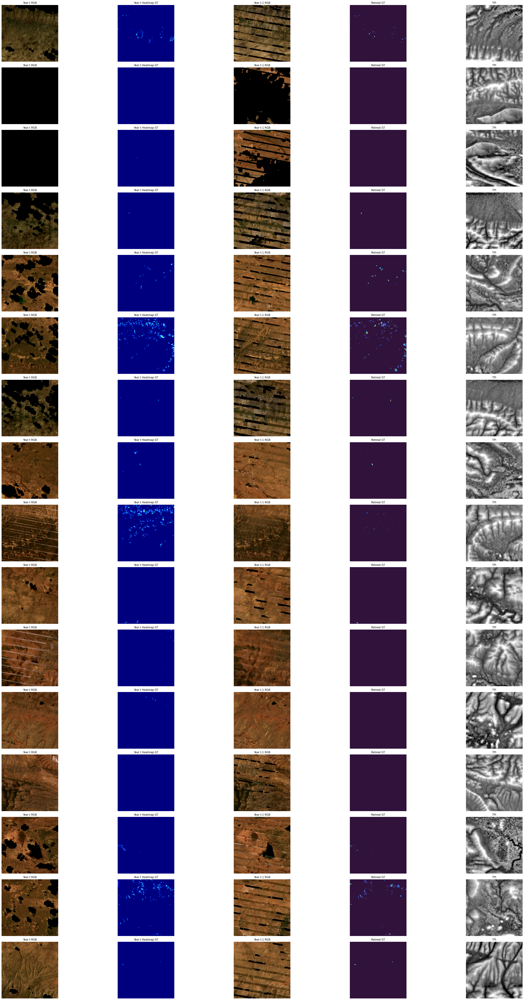

In [26]:
landsat_dm.show_batch(landsat_dm.train_dataloader, sample_num=16, bright=3, width=8)

## Initialize rts model

In [27]:
import torch.nn as nn

rts_model = SiameseRTS(
                    encoder_weights=ResNet50_Weights.SENTINEL2_ALL_MOCO,
                    in_bands=landsat_dm.bands,
                    use_dem=USE_DEM,
                    out_classes=2
)
rts_model.lr = nn.Parameter(torch.tensor(1e-4), requires_grad=False)
summary = ModelSummary(rts_model)
summary

ResNet50_Weights.SENTINEL2_ALL_MOCO  loaded
input shape of target weight torch.Size([64, 5, 7, 7])
input shape of loaded weight torch.Size([64, 13, 7, 7])


   | Name                   | Type                  | Params | Mode 
--------------------------------------------------------------------------
0  | shared_encoder         | TimmUniversalEncoder  | 23.5 M | train
1  | slump_decoder          | UnetPlusPlusDecoder   | 25.5 M | train
2  | retreat_decoder        | UnetPlusPlusDecoder   | 25.5 M | train
3  | dropout                | Dropout               | 0      | train
4  | fuser                  | FeatureFusionPerScale | 16.7 M | train
5  | seg_head               | ConvMLPHead           | 18.6 K | train
6  | heat_head              | ConvMLPHead           | 18.6 K | train
7  | retreat_head           | ConvMLPHead           | 9.3 K  | train
8  | loss_fn_dice           | DiceLoss              | 0      | train
9  | loss_fn_focal          | FocalLoss             | 0      | train
10 | loss_fn_mse            | MSELoss               | 0      | train
11 | loss_fn_area           | AreaPoolLoss          | 0      | train
12 | loss_fn_awing_weighted 

In [ ]:
# rts_model.model.decoder
# rts_model.model.segmentation_head

In [ ]:
# train_batch = next(iter(landsat_dm.val_dataloader()))
# dem = torch.unsqueeze(train_batch["mask"][:, 2, :, :], dim=1)
# print(dem.shape)
# print(train_batch['image'].shape)
# rts_model(train_batch['image'], dem=dem).shape

## Train rts model

In [28]:
import pytorch_lightning as pl
from pytorch_lightning.loggers import WandbLogger
import wandb

wandb_logger = WandbLogger(
    project="rts_retreat_project",
    name="unetpp_rgb_nir_dem_blh_north",
    save_dir="wandb_logs"
)


In [29]:
# rts_model.lr = rts_model.lr * 10
# first stage
# rts_model.loss_weight_mse = rts_model.loss_weight_mse * 10
# second stage
# rts_model.loss_weight_mse = rts_model.loss_weight_mse * 10
# rts_model.lr = rts_model.lr * 0.1
# third stage
# rts_model.loss_weight_area = rts_model.loss_weight_area * 100

print("Loss weight dice:", rts_model.loss_weight_dice)
print("Loss weight focal:", rts_model.loss_weight_focal)
print("Loss weight mse:", rts_model.loss_weight_mse)
print("Loss weight area:", rts_model.loss_weight_area)

print("Task weight seg :",  rts_model.task_weight_seg.item())
print("Task weight heat:",  rts_model.task_weight_heat.item())
print("Task weight ret :",  rts_model.task_weight_ret.item())

print("Learning rate:", rts_model.lr)

# TODO: use scheduled learning strategy

logger = TensorBoardLogger(save_dir="lightning_logs",
                           name="rts_model_unetpp_s2_rgb_nir_dem_moco_blh_hxm_dem_aug_16_22_r4_4_awing_l7_year_roi_80s_test")

display(f'Current logging directory: {logger.log_dir}')
ckpt_callback = ModelCheckpoint(save_top_k=1,
                                save_last=False,
                                monitor="valid_loss",
                                verbose=True,
                                mode="min")
early_stop_callback = EarlyStopping(
   monitor='valid_loss',
   min_delta=0.001,
   patience=10,
   verbose=True,
   mode='min'
)

trainer = pl.Trainer(
    accelerator='gpu',
    devices=[0],
    max_epochs=50,
    log_every_n_steps=25,
   #  logger=logger,
      logger=wandb_logger,
   #  gradient_clip_val=0.5,      # 添加梯度裁剪
   #  gradient_clip_algorithm="norm",
    enable_progress_bar=True,
    callbacks=[RichProgressBar(leave=False), 
               ckpt_callback, 
               early_stop_callback]
)

Loss weight dice: Parameter containing:
tensor(1.)
Loss weight focal: Parameter containing:
tensor(1.)
Loss weight mse: Parameter containing:
tensor(1.)
Loss weight area: Parameter containing:
tensor(1.)
Task weight seg : 1.0
Task weight heat: 1.0
Task weight ret : 3.0
Learning rate: Parameter containing:
tensor(1.0000e-04)


'Current logging directory: lightning_logs/rts_model_unetpp_s2_rgb_nir_dem_moco_blh_hxm_dem_aug_16_22_r4_4_awing_l7_year_roi_80s_test/version_0'

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


In [ ]:
print(torch.seed())
trainer.fit(rts_model, landsat_dm)

/home/ww/miniconda3/envs/torchgeo/lib/python3.11/site-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:80.)
  return _C._get_float32_matmul_precision()
You are using a CUDA device ('NVIDIA A100 80GB PCIe') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.

3065855347221335445


wandb: WARNING The anonymous setting has no effect and will be removed in a future version.
wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from /home/ww/.netrc.
wandb: Currently logged in as: wei-wu24 (wei-wu24-imperial-college-london) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


┏━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┓
┃    ┃ Name                   ┃ Type                  ┃ Params ┃ Mode  ┃
┡━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━┩
│ 0  │ shared_encoder         │ TimmUniversalEncoder  │ 23.5 M │ train │
│ 1  │ slump_decoder          │ UnetPlusPlusDecoder   │ 25.5 M │ train │
│ 2  │ retreat_decoder        │ UnetPlusPlusDecoder   │ 25.5 M │ train │
│ 3  │ dropout                │ Dropout               │      0 │ train │
│ 4  │ fuser                  │ FeatureFusionPerScale │ 16.7 M │ train │
│ 5  │ seg_head               │ ConvMLPHead           │ 18.6 K │ train │
│ 6  │ heat_head              │ ConvMLPHead           │ 18.6 K │ train │
│ 7  │ retreat_head           │ ConvMLPHead           │  9.3 K │ train │
│ 8  │ loss_fn_dice           │ DiceLoss              │      0 │ train │
│ 9  │ loss_fn_focal          │ FocalLoss             │      0 │ train │
│ 10 │ loss_fn_mse            │ MSELoss               │      0 │ train │
│ 11 │ loss_fn_area           │ AreaPoolLoss          │      0 │ train │
│ 12 │ loss_fn_awing_weighted │ LossWeightedAWing     │      0 │ train │
│ 13 │ loss_fn_ret            │ LossWeightedMSE       │      0 │ train │
│    │ other params           │ n/a                   │     10 │ n/a   │
└────┴────────────────────────┴───────────────────────┴────────┴───────┘

Trainable params: 91.2 M                                                                                           
Non-trainable params: 10                                                                                           
Total params: 91.2 M                                                                                               
Total estimated model params size (MB): 364                                                                        
Modules in train mode: 555                                                                                         
Modules in eval mode: 0

/home/ww/miniconda3/envs/torchgeo/lib/python3.11/site-packages/rich/live.py:256: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/ww/miniconda3/envs/torchgeo/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.
py:370: You have overridden `transfer_batch_to_device` in both `LightningModule` and `LightningDataModule`. It will
use the implementation from `LightningDataModule` instance.

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.1165721416473389

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.6309583783149719

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.1165721416473389

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.4632822275161743

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[valid epoch end] loss=2.3831, dice=0.9633, focal=0.0991, heat=1.2270, ret=0.0195, area=0.0352

/home/ww/miniconda3/envs/torchgeo/lib/python3.11/site-packages/torch/nn/functional.py:5167: UserWarning: Default 
grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify 
align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(

/home/ww/miniconda3/envs/torchgeo/lib/python3.11/site-packages/torch/nn/functional.py:5100: UserWarning: Default 
grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify 
align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.9705411195755005

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.7441861033439636

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.9282986521720886

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.6645910143852234

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.8967006802558899

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.6509876251220703

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[valid epoch end] loss=1.1234, dice=0.9712, focal=0.0115, heat=0.1378, ret=0.0008, area=0.0005

[train epoch end] loss=1.2362, dice=0.9722, focal=0.0317, heat=0.2205, ret=0.0036, area=0.0010

Metric valid_loss improved. New best score: 1.122
Epoch 0, global step 100: 'valid_loss' reached 1.12187 (best 1.12187), saving model to 'wandb_logs/rts_retreat_project/wy14z2ke/checkpoints/epoch=0-step=100.ckpt' as top 1


In [ ]:
from pathlib import Path

logger_name = "rts_model_unetpp_s2_rgb_nir_dem_moco_blh_hxm_dem_aug_16_22_r4_4_awing_l7_year_roi_80s_test"

ckpt_path_best = Path("lightning_logs") / logger_name / "version_58" / "checkpoints" / "epoch=54-step=5500.ckpt"
# ckpt_path_best = Path("wandb_logs/rts_retreat_project/5bw83duh/checkpoints/epoch=49-step=5000.ckpt")
# ckpt_path_best = Path("wandb_logs/rts_retreat_project/jalt2ev1/checkpoints/epoch=53-step=5400.ckpt")
print("Best ckpt:", ckpt_path_best)

assert ckpt_path_best.exists(), "checkpoint 文件不存在，路径要再确认一下"

rts_model = SiameseRTS.load_from_checkpoint(checkpoint_path=ckpt_path_best,
                                          encoder_name="resnet50",
                                          encoder_weights=ResNet50_Weights.SENTINEL2_ALL_MOCO,
                                          in_bands=landsat_dm.bands,
                                          use_dem=USE_DEM,
                                          out_classes=2,
                                          )

Best ckpt: lightning_logs/rts_model_unetpp_s2_rgb_nir_dem_moco_blh_hxm_dem_aug_16_22_r4_4_awing_l7_year_roi_80s_test/version_58/checkpoints/epoch=54-step=5500.ckpt
ResNet50_Weights.SENTINEL2_ALL_MOCO  loaded
input shape of target weight torch.Size([64, 5, 7, 7])
input shape of loaded weight torch.Size([64, 13, 7, 7])


In [ ]:
# ckpt_dir = Path(logger.save_dir) / logger.name / f'version_{logger.version}' / 'checkpoints' # type: ignore
# ckpt_path_last = list(ckpt_dir.glob('epoch*.ckpt'))[0]
# ckpt_path_best = Path(logger.save_dir) / logger.name / "best_model.ckpt"


In [ ]:
# rts_model = SiameseRTS.load_from_checkpoint(checkpoint_path=ckpt_path_last,
#                                           encoder_name="resnet50",
#                                           encoder_weights=ResNet50_Weights.SENTINEL2_ALL_MOCO,
#                                           in_bands=landsat_dm.bands,
#                                           use_dem=USE_DEM,
#                                           out_classes=2
#                                           )


ResNet50_Weights.SENTINEL2_ALL_MOCO  loaded
input shape of target weight torch.Size([64, 5, 7, 7])
input shape of loaded weight torch.Size([64, 13, 7, 7])


## Test rts model

In [ ]:
# # 移除进度条回调（避免错误）
# trainer.callbacks = [
#     cb for cb in trainer.callbacks 
#     if not isinstance(cb, pl.callbacks.progress.rich_progress.RichProgressBar)
# ]

# run test dataset
torch.manual_seed(3407)
test_metrics = trainer.test(model=rts_model,
                            # ckpt_path="best", #"best"
                            ckpt_path=ckpt_path_best,
                            dataloaders=landsat_dm, verbose=False)
display(test_metrics)


Restoring states from the checkpoint path at lightning_logs/rts_model_unetpp_s2_rgb_nir_dem_moco_blh_hxm_dem_aug_16_22_r4_4_awing_l7_year_roi_80s_test/version_58/checkpoints/epoch=54-step=5500.ckpt


/home/ww/miniconda3/envs/torchgeo/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:445: The dirpath has changed from 'lightning_logs/rts_model_unetpp_s2_rgb_nir_dem_moco_blh_hxm_dem_aug_16_22_r4_4_awing_l7_year_roi_80s_test/version_58/checkpoints' to 'wandb_logs/rts_retreat_project/cj53zb48/checkpoints', therefore `best_model_score`, `kth_best_model_path`, `kth_value`, `last_model_path` and `best_k_models` won't be reloaded. Only `best_model_path` will be reloaded.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
Loaded model weights from the checkpoint at lightning_logs/rts_model_unetpp_s2_rgb_nir_dem_moco_blh_hxm_dem_aug_16_22_r4_4_awing_l7_year_roi_80s_test/version_58/checkpoints/epoch=54-step=5500.ckpt


/home/ww/miniconda3/envs/torchgeo/lib/python3.11/site-packages/rich/live.py:256: UserWarning: install "ipywidgets" 
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.9146947860717773

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.5190080404281616

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.1165721416473389

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.44980698823928833

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.1165721416473389

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.622809648513794

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.1165721416473389

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.44980698823928833

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.1165721416473389

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.622809648513794

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.1165721416473389

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.622809648513794

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.996968150138855

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.622809648513794

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.1165721416473389

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.622809648513794

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.9714794158935547

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.622809648513794

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.9602434635162354

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.5190080404281616

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.1165721416473389

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.622809648513794

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.996968150138855

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.622809648513794

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.9593818187713623

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.622809648513794

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.1165721416473389

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.622809648513794

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.1165721416473389

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.622809648513794

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.9714794158935547

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.622809648513794

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.9593818187713623

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.44980698823928833

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.996968150138855

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.5190080404281616

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.1165721416473389

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.622809648513794

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.1165721416473389

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.44980698823928833

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.1165721416473389

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.622809648513794

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.1165721416473389

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.622809648513794

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.996968150138855

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.5536085963249207

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.1165721416473389

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.622809648513794

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.996968150138855

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.622809648513794

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.1165721416473389

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.622809648513794

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.1165721416473389

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.622809648513794

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.1165721416473389

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.622809648513794

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.9714794158935547

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.622809648513794

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.9593818187713623

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.44980698823928833

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.9593818187713623

[check] mask finite=True, shape=(32, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(32, 1, 256, 256), min=0.0, max=0.44980698823928833

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[check] heatmap finite=True, shape=(8, 1, 256, 256), min=0.0, max=0.9146947860717773

[check] mask finite=True, shape=(8, 1, 256, 256), min=0.0, max=1.0

[check] retreat_map finite=True, shape=(8, 1, 256, 256), min=0.0, max=0.44980698823928833

loss finite: {'dice': True, 'focal': True, 'heat': True, 'ret': True, 'area': True}

[test epoch end] loss=0.1639, dice=0.1099, focal=0.0096, heat=0.0443, ret=0.2791, area=0.0000

[{'test_loss': 0.16459718346595764}]

In [ ]:
ckpt_path_best = Path(logger.save_dir) / logger.name / "best_model.ckpt"
print(ckpt_path_best)
trainer.save_checkpoint(ckpt_path_best, weights_only=True)


lightning_logs/rts_model_unetpp_s2_rgb_nir_dem_moco_blh_hxm_dem_aug_16_22_r4_4_awing_l7_year_roi_80s_test/best_model.ckpt


## Visualize demo results

In [ ]:
# # 获取预测结果
# predictions = trainer.predict(model=rts_model, datamodule=landsat_dm)

# # 正确的解包方式
# first_batch_pred = predictions[0]  # 第一个 batch 的预测结果

# # 从字典中提取需要的数据
# image_t = first_batch_pred["image_t"]
# image_tm1 = first_batch_pred["image_tm1"] 
# pred_retreat = first_batch_pred["pred_retreat"]
# pred_heat = first_batch_pred["pred_heat"]
# prob_mask = first_batch_pred["prob_mask"]

# print(f"Image t shape: {image_t.shape}")
# print(f"Image t-1 shape: {image_tm1.shape}")
# print(f"Predicted retreat shape: {pred_retreat.shape}")
# print(f"Predicted heatmap shape: {pred_heat.shape}")
# print(f"Predicted mask prob shape: {prob_mask.shape}")

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch

rts_model.eval()
val_loader = landsat_dm.val_dataloader()
batch = next(iter(val_loader))

with torch.no_grad():
    outputs = rts_model(
        batch["image_t"].to(rts_model.device),
        batch["image_tm1"].to(rts_model.device),
        batch.get("dem_t", None).to(rts_model.device) if batch.get("dem_t", None) is not None else None,
        batch.get("dem_tm1", None).to(rts_model.device) if batch.get("dem_tm1", None) is not None else None,
    )
    logits_mask = outputs["logits_mask"]
    pred_heat = outputs["heatmap"]
    pred_ret = outputs["retreat"] * rts_model.retreat_scale   # 反缩放
    prob_mask = logits_mask.sigmoid()

# 全部搬回 CPU
image_t = batch["image_t"].cpu()       # [B,C,H,W]
image_tm1 = batch["image_tm1"].cpu()
gt_mask = batch["mask"].cpu()
gt_heat = batch["heatmap"].cpu()
gt_ret = batch.get("retreat_map", None)
if gt_ret is not None:
    gt_ret = gt_ret.cpu() * rts_model.retreat_scale  # 反缩放到真实单位

pred_mask = prob_mask.cpu()
pred_heat = pred_heat.cpu()
pred_ret = pred_ret.cpu()

In [ ]:
# ----------------- 工具函数 -----------------
def to_np(t: torch.Tensor):
    return t.detach().cpu().numpy()

# ----------------- 转 numpy 并 squeeze -----------------
imgs_t = image_t
imgs_tm1 = image_tm1

gt_masks = to_np(gt_mask)
gt_heats = to_np(gt_heat)
pr_masks = to_np(pred_mask)
pr_heats = to_np(pred_heat)
pr_rets = to_np(pred_ret)
gt_rets = to_np(gt_ret) if gt_ret is not None else None

if gt_masks.ndim == 4 and gt_masks.shape[1] == 1:
    gt_masks = gt_masks.squeeze(1)
if gt_heats.ndim == 4 and gt_heats.shape[1] == 1:
    gt_heats = gt_heats.squeeze(1)
if pr_masks.ndim == 4 and pr_masks.shape[1] == 1:
    pr_masks = pr_masks.squeeze(1)
if pr_heats.ndim == 4 and pr_heats.shape[1] == 1:
    pr_heats = pr_heats.squeeze(1)
if pr_rets.ndim == 4 and pr_rets.shape[1] == 1:
    pr_rets = pr_rets.squeeze(1)
if gt_rets is not None and gt_rets.ndim == 4 and gt_rets.shape[1] == 1:
    gt_rets = gt_rets.squeeze(1)

# ----------------- 画前 N 个样本 -----------------
N = min(32, imgs_t.shape[0])

seg_iou_list = []
heat_mse_list = []
heat_mae_list = []

for i in range(N):
    img_t = imgs_t[i]      # [C,H,W] (tensor)
    img_tm1 = imgs_tm1[i]
    m_gt = gt_masks[i]      # [H,W]
    m_pr = pr_masks[i]
    h_gt = gt_heats[i]
    h_pr = pr_heats[i]
    r_pr = pr_rets[i]
    r_gt = gt_rets[i] if gt_rets is not None else None

    # ---------- 计算误差 ----------
    # 1) segmentation：IoU / F1 / pixel 精度
    m_pr_bin = (m_pr > 0.5).astype(np.float32)
    inter = (m_pr_bin * m_gt).sum()
    union = (m_pr_bin + m_gt > 0).sum()
    iou   = inter / union if union > 0 else np.nan

    # 2) heatmap：MSE / MAE（只在有 GT 的地方）
    heat_mse = float(((h_pr - h_gt) ** 2).mean())
    heat_mae = float(np.abs(h_pr - h_gt).mean())

    # 3) retreat：MSE / MAE（只在有 GT 或有预测的地方）
    if r_gt is not None:
        valid = (np.isfinite(r_gt))  # 或 (r_gt > 0) | (r_pr > 0)
        if valid.sum() > 0:
            ret_mse = float(((r_pr[valid] - r_gt[valid]) ** 2).mean())
            ret_mae = float(np.abs(r_pr[valid] - r_gt[valid]).mean())
        else:
            ret_mse = np.nan
            ret_mae = np.nan
    else:
        ret_mse = np.nan
        ret_mae = np.nan

    seg_iou_list.append(iou)
    heat_mse_list.append(heat_mse)
    heat_mae_list.append(heat_mae)
    
    plt.figure(figsize=(30, 4))

    # 1) t 年 RGB
    plt.subplot(1, 9, 1)
    if img_t.shape[0] >= 3:
        rgb_image = img_t[:3, :, :].cpu().numpy()      # [3,H,W]
        rgb_image = np.transpose(rgb_image, (1, 2, 0)) # [H,W,3]
        rgb_image = np.clip((rgb_image + 2) / 4, 0, 1) # 简单线性拉伸
        plt.imshow(rgb_image)
    plt.title("Image t (RGB)")
    plt.axis("off")

    # 2) t-1 年 RGB
    plt.subplot(1, 9, 2)
    if img_tm1.shape[0] >= 3:
        rgb_tm1 = img_tm1[:3, :, :].cpu().numpy()
        rgb_tm1 = np.transpose(rgb_tm1, (1, 2, 0))
        rgb_tm1 = np.clip((rgb_tm1 + 2) / 4, 0, 1)
        plt.imshow(rgb_tm1)
    plt.title("Image t-1 (RGB)")
    plt.axis("off")

    # 3) t 年 TPI（dem_t）
    plt.subplot(1, 9, 3)
    if img_t.shape[0] > 3:
        plt.imshow(img_t[3].numpy(), cmap="gray")
        plt.title("Mean TPI t")
    plt.axis("off")

    # 4) Segment GT
    plt.subplot(1, 9, 4)
    plt.imshow(m_gt, cmap="gray", vmin=0, vmax=1)
    plt.title("Segment GT")
    plt.axis("off")

    # 5) Segment Pred
    plt.subplot(1, 9, 5)
    plt.imshow(m_pr, cmap="gray", vmin=0, vmax=1)
    plt.title("Segment Pred")
    plt.axis("off")

    # 6) Heatmap GT（0–1 归一化的）
    plt.subplot(1, 9, 6)
    plt.imshow(h_gt, vmin=0, vmax=1.3, cmap="jet")
    plt.title("Heatmap GT")
    plt.axis("off")

    # 7) Heatmap Pred
    plt.subplot(1, 9, 7)
    plt.imshow(np.clip(h_pr, 0, 1.5), vmin=0, vmax=1.3, cmap="jet")
    plt.title("Heatmap Pred")
    plt.axis("off")

    # 8) Retreat GT
    plt.subplot(1, 9, 8)
    if r_gt is not None:
        vmax_gt = max(float(r_gt.max()), 1.0)
        plt.imshow(np.clip(r_gt, 0, vmax_gt), cmap="plasma", vmin=0, vmax=vmax_gt)
    else:
        plt.imshow(np.zeros_like(r_pr), cmap="plasma", vmin=0, vmax=1)
    plt.title("Retreat GT")
    plt.axis("off")

    # 9) Retreat Pred
    plt.subplot(1, 9, 9)
    vmax_pr = max(float(r_pr.max()), 1.0)
    plt.imshow(np.clip(r_pr, 0, vmax_pr), cmap="plasma", vmin=0, vmax=vmax_pr)
    plt.title("Retreat Pred")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

    # 统计信息
    print(f"Sample {i+1} stats:")
    print(f"GT mask nonzero pixels: {m_gt.sum():.0f}")
    print(f"Pred mask nonzero>0.5: {(m_pr>0.5).sum():.0f}")
    print(f"Seg IoU: {iou:.3f}")
    print(f"GT heat max: {h_gt.max():.3f}")
    print(f"Pred heat max: {h_pr.max():.3f}")
    print(f"Heat MSE / MAE: {heat_mse:.6f} / {heat_mae:.6f}")
    print(f"Pred retreat max: {r_pr.max():.3f}")
    if r_gt is not None:
        print(f"GT retreat max: {r_gt.max():.3f}")
        print(f"Retreat MSE / MAE: {ret_mse:.6f} / {ret_mae:.6f}")
    print("-"*60)

In [ ]:
seg_iou_arr = np.array(seg_iou_list, dtype=np.float32)
heat_mse_arr = np.array(heat_mse_list, dtype=np.float32)
heat_mae_arr = np.array(heat_mae_list, dtype=np.float32)

def summary(arr, name):
    arr_valid = arr[~np.isnan(arr)]
    print(f"{name}:")
    print(f"count = {len(arr_valid)}")
    print(f"mean = {arr_valid.mean():.6f}")
    print(f"median = {np.median(arr_valid):.6f}")
    print(f"p25/p75 = {np.percentile(arr_valid,25):.6f} / {np.percentile(arr_valid,75):.6f}")
    print(f"min/max = {arr_valid.min():.6f} / {arr_valid.max():.6f}")
    print("-"*60)

summary(seg_iou_arr, "Seg IoU")
summary(heat_mse_arr, "Heat MSE")
summary(heat_mae_arr, "Heat MAE")

Seg IoU:
count = 27
mean = 0.578850
median = 0.683126
p25/p75 = 0.339551 / 0.815374
min/max = 0.000000 / 0.954577
------------------------------------------------------------
Heat MSE:
count = 32
mean = 0.000279
median = 0.000101
p25/p75 = 0.000043 / 0.000320
min/max = 0.000024 / 0.001512
------------------------------------------------------------
Heat MAE:
count = 32
mean = 0.005879
median = 0.004618
p25/p75 = 0.004232 / 0.006043
min/max = 0.003668 / 0.018108
------------------------------------------------------------


bias

In [ ]:
# 1. 简单 Bias：平均预测值 - 平均真实值
bias_simple = (h_pr - h_gt).mean()
print(f"Simple Bias (mean pred - mean gt): {bias_simple:.6f}")

# 2. 按像素计算 Bias
bias_per_pixel = h_pr - h_gt  # [H,W]
bias_mean = bias_per_pixel.mean()
bias_std = bias_per_pixel.std()
print(f"Bias Mean: {bias_mean:.6f}, Bias Std: {bias_std:.6f}")

# 3. 在 GT 非零区域计算 Bias（更有意义）
mask_gt_valid = (h_gt > 0.01)  # 或其他阈值
if mask_gt_valid.sum() > 0:
    bias_in_valid = (h_pr[mask_gt_valid] - h_gt[mask_gt_valid]).mean()
    print(f"Bias in GT valid region: {bias_in_valid:.6f}")

# 4. 对多个样本汇总统计 Bias
bias_list = []
for i in range(N):
    h_gt = gt_heats[i]
    h_pr = pr_heats[i]
    mask_valid = (h_gt > 0.01)
    if mask_valid.sum() > 0:
        bias = (h_pr[mask_valid] - h_gt[mask_valid]).mean()
        bias_list.append(bias)

bias_arr = np.array(bias_list, dtype=np.float32)
print(f"\nBias Statistics Across Samples:")
print(f"Mean: {bias_arr.mean():.6f}")
print(f"Std: {bias_arr.std():.6f}")
print(f"Min/Max: {bias_arr.min():.6f} / {bias_arr.max():.6f}")

Simple Bias (mean pred - mean gt): 0.000814
Bias Mean: 0.000814, Bias Std: 0.004930

Bias Statistics Across Samples:
Mean: -0.043985
Std: 0.037262
Min/Max: -0.130644 / 0.004371


In [ ]:
# 在 Bias 统计可视化单元格后添加

# ===================== 统计可视化 =====================
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# 1. IoU 分布直方图
ax = axes[0, 0]
ax.hist(seg_iou_arr[~np.isnan(seg_iou_arr)], bins=20, edgecolor='black', alpha=0.7, color='steelblue')
ax.axvline(np.nanmean(seg_iou_arr), color='red', linestyle='--', label=f'Mean={np.nanmean(seg_iou_arr):.3f}')
ax.axvline(np.nanmedian(seg_iou_arr), color='orange', linestyle='--', label=f'Median={np.nanmedian(seg_iou_arr):.3f}')
ax.set_xlabel('IoU')
ax.set_ylabel('Count')
ax.set_title('Segmentation IoU Distribution')
ax.legend()

# 2. Heatmap MAE 分布
ax = axes[0, 1]
ax.hist(heat_mae_arr, bins=20, edgecolor='black', alpha=0.7, color='coral')
ax.axvline(heat_mae_arr.mean(), color='red', linestyle='--', label=f'Mean={heat_mae_arr.mean():.4f}')
ax.set_xlabel('MAE')
ax.set_ylabel('Count')
ax.set_title('Heatmap MAE Distribution')
ax.legend()

# 3. Heatmap Bias 分布
ax = axes[0, 2]
ax.hist(bias_arr, bins=20, edgecolor='black', alpha=0.7, color='mediumpurple')
ax.axvline(0, color='black', linestyle='-', linewidth=2)
ax.axvline(bias_arr.mean(), color='red', linestyle='--', label=f'Mean={bias_arr.mean():.4f}')
ax.set_xlabel('Bias (Pred - GT)')
ax.set_ylabel('Count')
ax.set_title('Heatmap Bias Distribution')
ax.legend()

# 4. GT vs Pred 散点图 (Heatmap 均值)
ax = axes[1, 0]
gt_means = [gt_heats[i].mean() for i in range(N)]
pr_means = [pr_heats[i].mean() for i in range(N)]
ax.scatter(gt_means, pr_means, alpha=0.6, edgecolor='k', s=50)
lims = [0, max(max(gt_means), max(pr_means)) * 1.1]
ax.plot(lims, lims, 'r--', label='y=x (Perfect)')
ax.set_xlabel('GT Heatmap Mean')
ax.set_ylabel('Pred Heatmap Mean')
ax.set_title('GT vs Pred Heatmap (Mean per Sample)')
ax.legend()
ax.set_xlim(lims)
ax.set_ylim(lims)

# 5. Boxplot 比较
ax = axes[1, 1]
data_box = [seg_iou_arr[~np.isnan(seg_iou_arr)], heat_mae_arr, np.abs(bias_arr)]
bp = ax.boxplot(data_box, labels=['IoU', 'MAE', '|Bias|'], patch_artist=True)
colors = ['steelblue', 'coral', 'mediumpurple']
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
ax.set_ylabel('Value')
ax.set_title('Metrics Boxplot Comparison')

# 6. 误差统计汇总表
ax = axes[1, 2]
ax.axis('off')
stats_text = f"""
╔══════════════════════════════════════════╗
║         EVALUATION SUMMARY               ║
╠══════════════════════════════════════════╣
║ Segmentation IoU                         ║
║   Mean: {np.nanmean(seg_iou_arr):.4f}  Median: {np.nanmedian(seg_iou_arr):.4f}     ║
║   Min: {np.nanmin(seg_iou_arr):.4f}   Max: {np.nanmax(seg_iou_arr):.4f}        ║
╠══════════════════════════════════════════╣
║ Heatmap MAE                              ║
║   Mean: {heat_mae_arr.mean():.4f}  Std: {heat_mae_arr.std():.4f}       ║
╠══════════════════════════════════════════╣
║ Heatmap MSE                              ║
║   Mean: {heat_mse_arr.mean():.6f}  Std: {heat_mse_arr.std():.6f} ║
╠══════════════════════════════════════════╣
║ Heatmap Bias                             ║
║   Mean: {bias_arr.mean():+.4f}  Std: {bias_arr.std():.4f}      ║
║   (+ = over-predict, - = under-predict)  ║
╚══════════════════════════════════════════╝
"""
ax.text(0.1, 0.5, stats_text, fontsize=10, family='monospace', 
        verticalalignment='center', transform=ax.transAxes,
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.tight_layout()
plt.show()

In [ ]:
bias_list = []
bias_valid_list = []

for i in range(N):
    h_gt = gt_heats[i]
    h_pr = pr_heats[i]
    
    bias_full = (h_pr - h_gt).mean()
    bias_list.append(bias_full)
    
    mask_valid = (h_gt > 0.01)
    if mask_valid.sum() > 0:
        bias_valid = (h_pr[mask_valid] - h_gt[mask_valid]).mean()
        bias_valid_list.append(bias_valid)

bias_arr = np.array(bias_list, dtype=np.float32)
bias_valid_arr = np.array(bias_valid_list, dtype=np.float32)

print("=" * 60)
print("Heatmap Bias Statistics:")
print(f"Full Image Bias - Mean: {bias_arr.mean():.6f}, Std: {bias_arr.std():.6f}")
print(f"Valid Region Bias - Mean: {bias_valid_arr.mean():.6f}, Std: {bias_valid_arr.std():.6f}")
print("=" * 60)

for i in range(min(32, N)):
    h_gt = gt_heats[i]
    h_pr = pr_heats[i]
    bias_map = h_pr - h_gt
    
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    
    # GT Heatmap
    im0 = axes[0].imshow(h_gt, vmin=0, vmax=1.3, cmap="jet")
    axes[0].set_title(f"Sample {i}: GT Heatmap")
    axes[0].axis("off")
    plt.colorbar(im0, ax=axes[0], fraction=0.046)
    
    # Pred Heatmap
    im1 = axes[1].imshow(np.clip(h_pr, 0, 1.5), vmin=0, vmax=1.3, cmap="jet")
    axes[1].set_title(f"Pred Heatmap")
    axes[1].axis("off")
    plt.colorbar(im1, ax=axes[1], fraction=0.046)
    
    # Bias Map
    im2 = axes[2].imshow(bias_map, cmap='jet', vmin=-0.5, vmax=0.5)
    axes[2].set_title(f"Bias (Pred-GT), mean={bias_map.mean():.3f}")
    axes[2].axis("off")
    plt.colorbar(im2, ax=axes[2], fraction=0.046, label='Over/Under')
    
    plt.tight_layout()
    plt.show()